In [0]:
!pip install geopandas
import geopandas as gd
import matplotlib 
# matplotlib.use('nbagg')
%matplotlib inline
from matplotlib import pyplot as plt
from shapely.geometry import Point,Polygon
import numpy as np
import pandas as pd
from tqdm import tqdm
import seaborn as sns
import os

     |████████████████████████████████| 921kB 2.8MB/s 
     |████████████████████████████████| 11.8MB 195kB/s 
     |████████████████████████████████| 10.1MB 34.3MB/s 


In [0]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#Unzipping files when needed
os.chdir("drive/My Drive/Datalab Course Project")
# !unzip drive/'My Drive'/'Datalab Course Project'/uk-road-safety-accidents-and-vehicles.zip -d drive/'My Drive'/'Datalab Course Project'/
# !unzip ./'Great Britain'/great-britain-roads-shape.zip -d ./'Great Britain'/

In [0]:
map_uk = gd.read_file("./Great Britain/roads.shp") 
df = pd.read_csv('./Accident_Information.csv')
map_london = gd.read_file("./london/London-polygon.shp")

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [0]:
#Extracting longitude and latitude
X = df['Longitude']
Y = df['Latitude']

#For better color schemes
mapping = {'Slight':0,'Serious':1.25,'Fatal':2}
val = df.replace({'Accident_Severity':mapping}).Accident_Severity

casuality = df.Number_of_Casualties

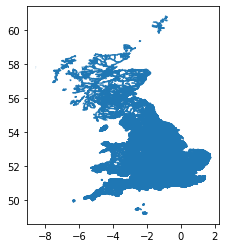

In [0]:
map_uk.plot()

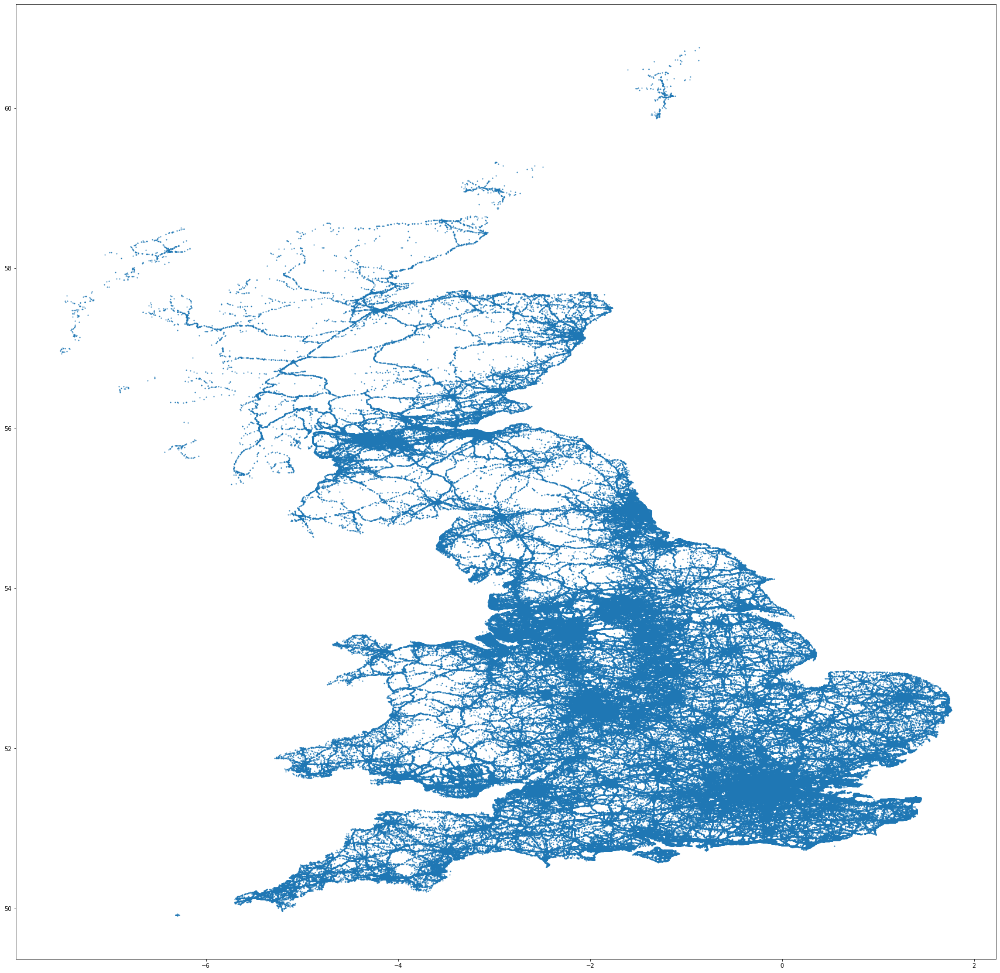

In [0]:
plt.figure(figsize=(30,30))
plt.scatter(X,Y,s=1)
plt.show()

In [0]:
#Data points from accident dataframe
df_temp = gd.GeoDataFrame() 
df_temp['latitude'] = Y
df_temp['longitude'] = X
df_temp['severity'] = val
df_temp['casuality'] = casuality
df_temp['name'] = 'data_points'
df_temp['road'] = df["1st_Road_Class"]
df_temp["no:"] = df["1st_Road_Number"]
df_temp["Year"] = df["Year"]
#For ease of forming geopandas points, creating latitude and longitude in tuples
df_temp['new_col'] = list(zip(df_temp.longitude, df_temp.latitude))
#Forming geopandas points
df_temp['geometry'] = df_temp['new_col'].apply(lambda x : Point(x) )
#dropping temporary column
df_temp.drop(['new_col'],axis=1,inplace=True)

Text(0.5, 1, 'UK Map of Accident incidents')

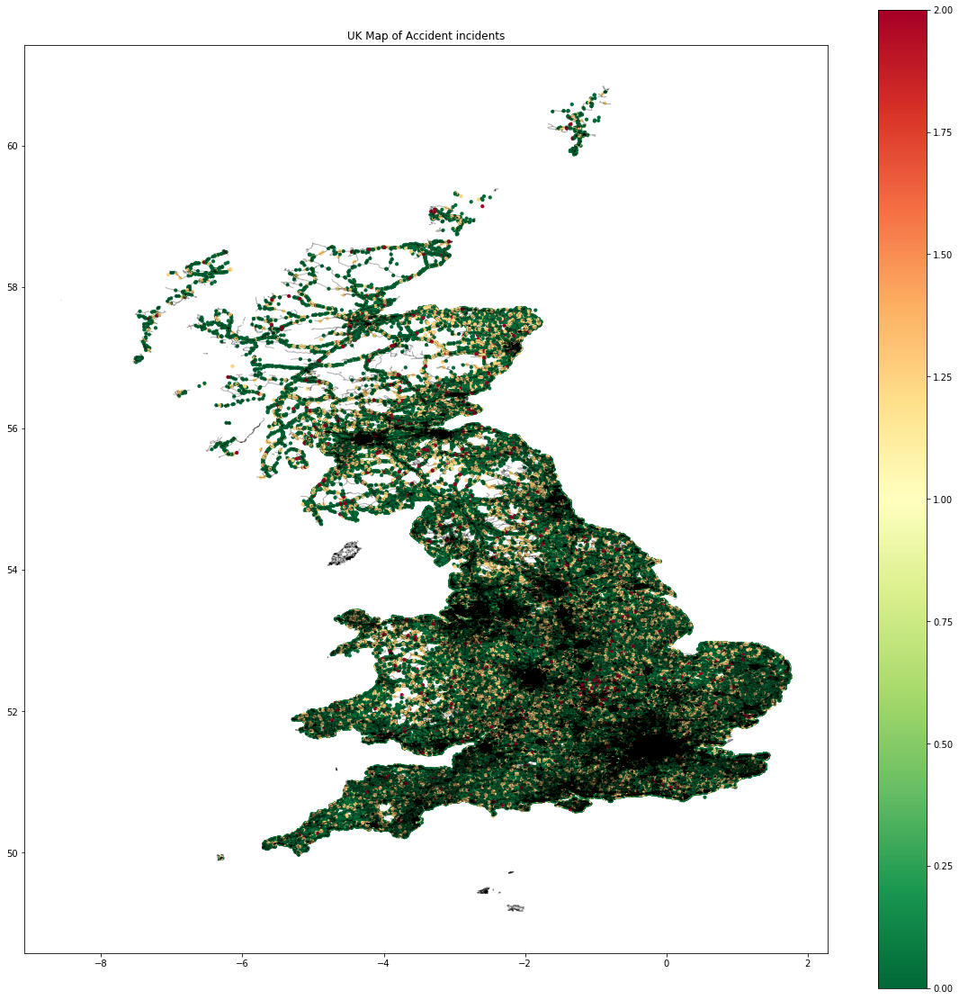

In [0]:
fig, ax = plt.subplots(figsize = (20,20)) 
df_temp.plot(column='severity', cmap='RdYlGn_r',alpha = 2,legend=True,ax=ax,markersize=10)
map_uk.plot(figsize=(10, 10), alpha=0.3, edgecolor='k',linewidth=1,ax=ax,color='k')

plt.title("UK Map of Accident incidents")

In [0]:
#London, Brimimgham, Manchester

In [0]:
#Extracting points and roads in London
london = map_london.geometry.unary_union
within_london = df_temp[df_temp.geometry.within(london)]
london_roads = map_uk[map_uk.geometry.within(london)]
london_roads.reset_index(inplace=True,drop=True)

In [0]:
#Initializing all roads with 0 casulaity
london_roads['casuality'] = 0
london_roads["lon_bounds"] = london_roads.geometry.bounds["minx"]
london_roads["lon_bounds_up"] = london_roads.geometry.bounds["maxx"]
london_roads["lat_bounds"] = london_roads.geometry.bounds["miny"]
london_roads["lat_bounds_up"] = london_roads.geometry.bounds["minx"]



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documenta

In [0]:
#Since the road number from accident is unreliable, we use nearest distance of a point from line(roads) to find the road
t = 0.0007
for i in tqdm(range(len(within_london)),desc="Assigning roads to points",position=0,leave=True):
  temp_roads = london_roads.loc[(abs(london_roads["lon_bounds"]-within_london.iloc[i,:]["longitude"])<=t) | (abs(london_roads["lat_bounds"]-within_london.iloc[i,:]["latitude"])<=t) | (abs(london_roads["lon_bounds_up"]-within_london.iloc[i,:]["longitude"])<=t) | (abs(london_roads["lat_bounds_up"]-within_london.iloc[i,:]["latitude"])<=t)]
  min_index = temp_roads.geometry.distance(within_london.iloc[i,:].geometry).idxmin()
  london_roads["casuality"].iloc[min_index] = london_roads.iloc[min_index,:]["casuality"] + within_london.iloc[i,:]["casuality"]
london_roads.to_file("./london/London_causality/Casuality_London.shp")

Assigning roads to points:   0%|          | 0/320473 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
Assigning roads to points: 100%|██████████| 320473/320473 [2:03:05<00:00, 43.39it/s]


In [0]:
london_roads = gd.read_file("./london/London_causality/Casuality_London.shp")

In [0]:
#Max Casualities
London_roads.iloc[London_roads.casuality.idxmax(),:]

osm_id                                                     8159308
name                                                 Uxbridge Road
ref                                                          A4020
type                                                       primary
oneway                                                           0
maxspeed                                                         0
geometry         LINESTRING (-0.2712309 51.5072514, -0.2710052 ...
casuality                                                      589
lon_bounds                                               -0.271231
lon_bounds_up                                            -0.235509
lat_bounds                                                 51.5064
lat_bounds_up                                            -0.271231
Name: 36582, dtype: object

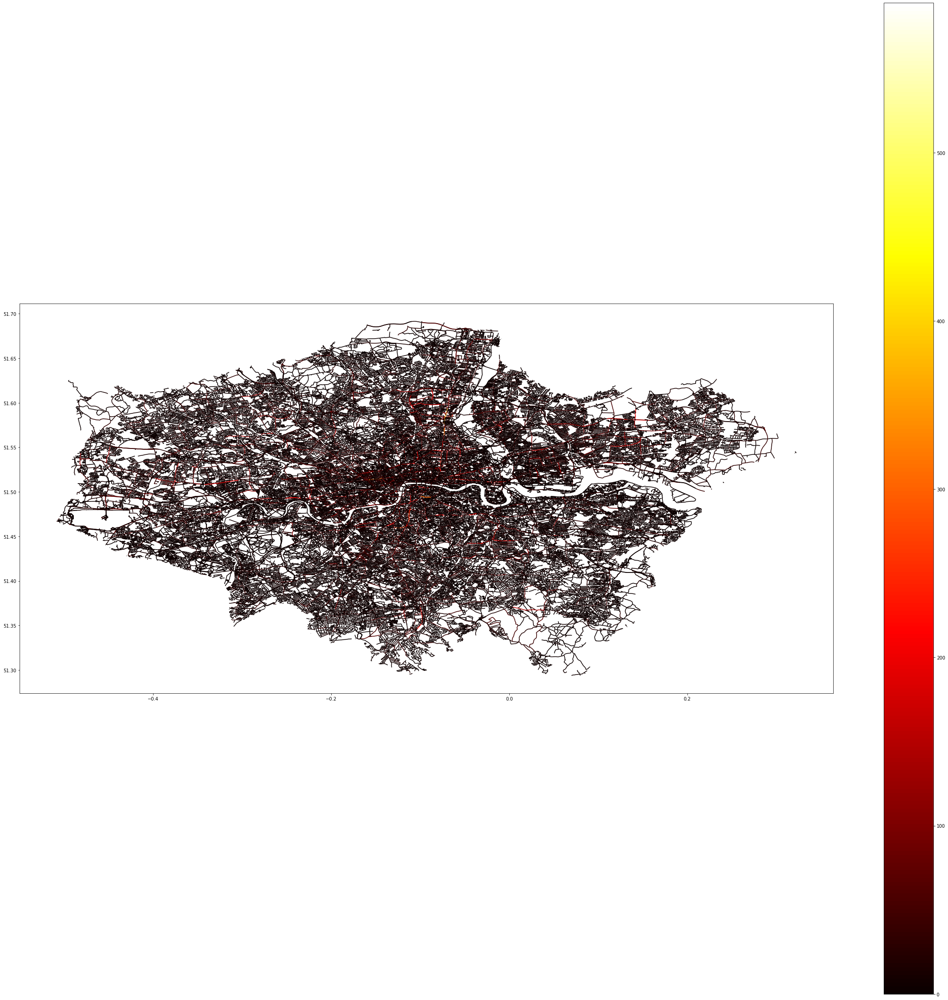

In [0]:
fig, ax = plt.subplots(figsize = (40,40)) 
london_roads.plot(column='casuality', cmap='hot',legend=True,ax=ax)
# london_roads.plot(figsize=(10, 10), alpha=0.3, edgecolor='k',linewidth=1,ax=ax,color='k')

In [0]:
#Causality/length calculation
london_roads.to_crs(epsg=3857,inplace=True) 
london_roads["Road_length"] = london_roads.geometry.length
london_roads["Casuality per meter"] = london_roads["casuality"]/london_roads["Road_length"]

In [0]:
london_roads.sort_values(by="casuality",ascending=False)[["name","type","ref","casuality","Road_length","Casuality per meter"]].head(20)

,name,type,ref,casuality,Road_length,Casuality per meter
36582,Uxbridge Road,primary,A4020,589,4002.874301,0.147144
13952,High Road,trunk,A10,369,3291.887336,0.112094
591,Oxford Street,secondary,None,320,1870.759443,0.171054
70409,Stamford Hill,trunk,A10,311,1459.168194,0.213135
90242,New Kent Road,trunk,A201,309,1353.018965,0.228378
5917,Acre Lane,primary,A2217,267,1558.081688,0.171365
88532,Brixton Road,trunk,A23,253,2742.024537,0.092268
1851,"High Street, Lewisham",primary,A21,250,887.329182,0.281744
2596,Broad Lane,trunk,A10,249,1490.939561,0.167009
965,Kingsland Road,trunk,A10,244,3571.529062,0.068318


In [0]:
high_casual=london_roads.sort_values(by="Casuality per meter",ascending=False)[["name","type","ref","casuality","Road_length","Casuality per meter","geometry"]]
high_casual.head(20)

,name,type,ref,casuality,Road_length,Casuality per meter,geometry
83033,None,service,None,102,17.591072,5.798396,"LINESTRING (-12841.683 6721046.292, -12827.267..."
68124,Shelford Place,unclassified,None,2,0.559332,3.575693,"LINESTRING (-9733.765 6720803.490, -9733.387 6..."
37747,None,footway,None,36,12.006930,2.998268,"LINESTRING (-11546.737 6721870.870, -11538.299..."
62640,None,steps,None,24,8.743592,2.744867,"LINESTRING (-11263.707 6709289.618, -11271.232..."
12233,Seven Sisters Road,trunk,A503,101,36.912755,2.736182,"LINESTRING (-10670.775 6722867.555, -10700.219..."
64961,None,cycleway,None,18,7.189428,2.503676,"LINESTRING (-13841.143 6715557.837, -13844.827..."
10772,None,trunk,None,64,25.691515,2.491095,"LINESTRING (18361.705 6724862.438, 18363.875 6..."
80260,Bancroft Road,residential,None,33,16.205522,2.036343,"LINESTRING (-4668.495 6714251.504, -4663.196 6..."
17338,None,motorway_link,None,66,34.791562,1.897012,"LINESTRING (-4711.675 6742952.579, -4746.296 6..."
68740,None,pedestrian,None,125,68.892979,1.814408,"LINESTRING (-17487.357 6714161.369, -17507.350..."


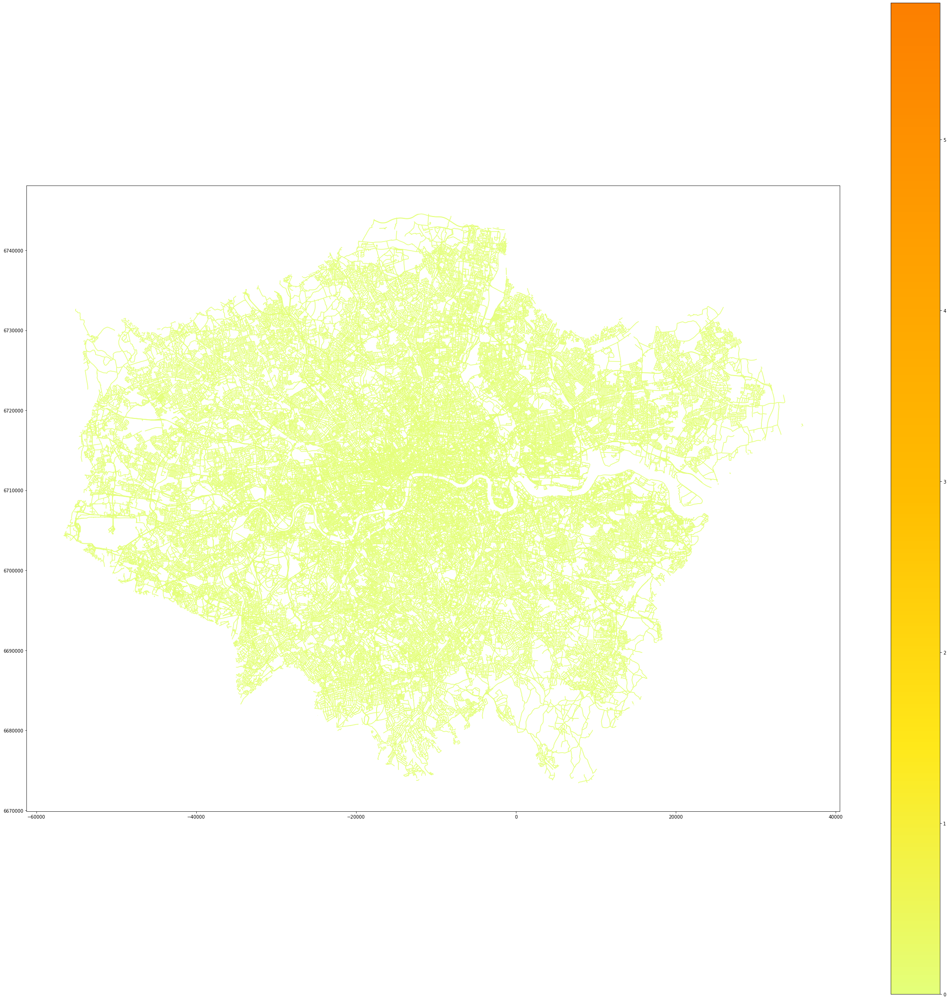

In [0]:
#Plotting top 20 roads where police intervention needed
fig, ax = plt.subplots(figsize = (40,40)) 
high_casual.plot(column='Casuality per meter', cmap='Wistia',legend=True,ax=ax)

In [0]:
#Loading map of manchester
map_city = gd.read_file("./Manchester/Manchester-polygon.shp")

#Extracting points and roads in manchester
city = map_city.geometry.unary_union
within_city = df_temp[df_temp.geometry.within(city)]
city_roads = map_uk[map_uk.geometry.within(city)]
city_roads.reset_index(inplace=True,drop=True)

#Initializing all roads with 0 casulaity
city_roads['casuality'] = 0
city_roads["lon_bounds"] = city_roads.geometry.bounds["minx"]
city_roads["lon_bounds_up"] = city_roads.geometry.bounds["maxx"]
city_roads["lat_bounds"] = city_roads.geometry.bounds["miny"]
city_roads["lat_bounds_up"] = city_roads.geometry.bounds["minx"]

#Since the road number from accident is unreliable, we use nearest distance of a point from line(roads) to find the road
t = 0.0007
for i in tqdm(range(len(within_city)),desc="Assigning roads to points",position=0,leave=True):
  temp_roads = city_roads.loc[(abs(city_roads["lon_bounds"]-within_city.iloc[i,:]["longitude"])<=t) | (abs(city_roads["lat_bounds"]-within_city.iloc[i,:]["latitude"])<=t) | (abs(city_roads["lon_bounds_up"]-within_city.iloc[i,:]["longitude"])<=t) | (abs(city_roads["lat_bounds_up"]-within_city.iloc[i,:]["latitude"])<=t)]
  min_index = temp_roads.geometry.distance(within_city.iloc[i,:].geometry).idxmin()
  city_roads["casuality"].iloc[min_index] = city_roads.iloc[min_index,:]["casuality"] + within_city.iloc[i,:]["casuality"]
city_roads.to_file("./Manchester/Manchester_causality/Casuality_Manchester.shp")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,

In [0]:
Manchester_roads = city_roads.copy()

In [0]:
#Max Casualities
Manchester_roads.iloc[Manchester_roads.casuality.idxmax(),:]

osm_id                                                    24781758
name                                               Ashton Old Road
ref                                                           A635
type                                                         trunk
oneway                                                           0
maxspeed                                                         0
geometry         LINESTRING (-2.2167417 53.4752779, -2.2163898 ...
casuality                                                      254
lon_bounds                                                -2.21674
lon_bounds_up                                             -2.14949
lat_bounds                                                 53.4724
lat_bounds_up                                             -2.21674
Name: 5385, dtype: object

Text(0.5, 1, 'Manchester road heat map')

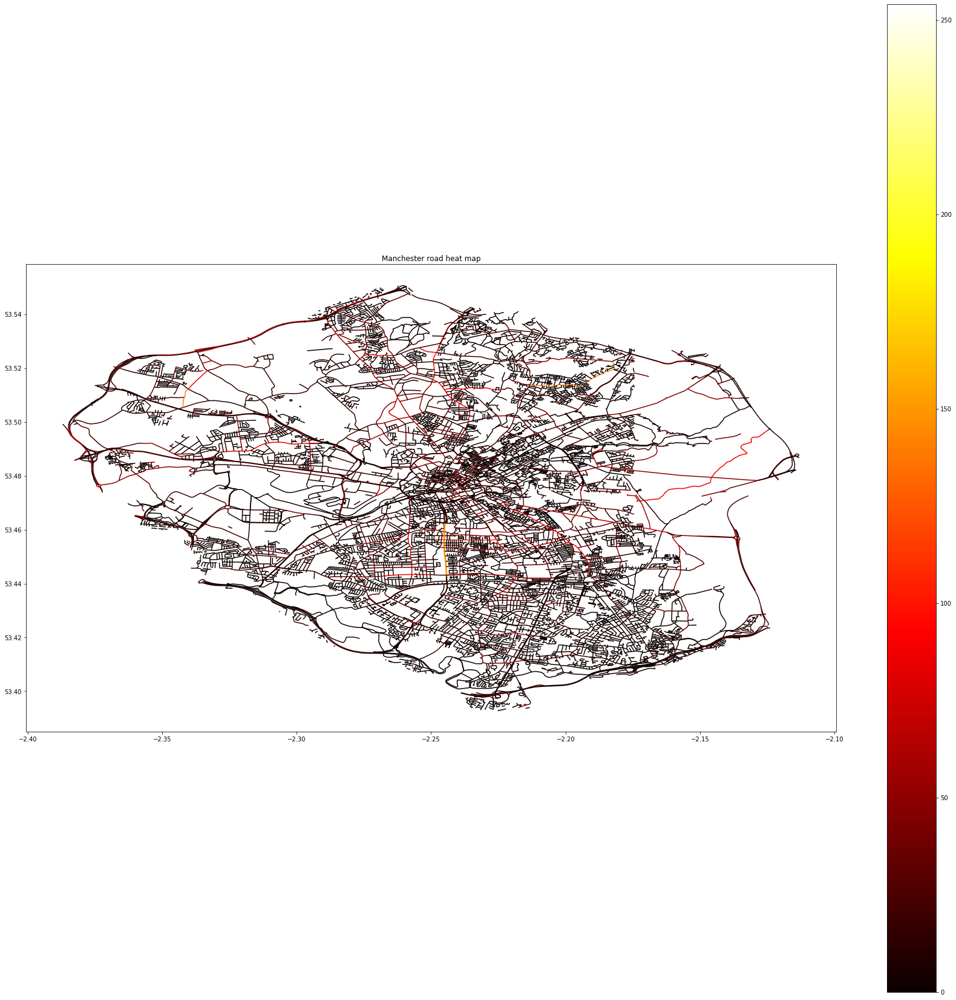

In [0]:
fig, ax = plt.subplots(figsize = (30,30)) 
Manchester_roads.plot(column='casuality', cmap='hot',legend=True,ax=ax)
plt.title("Manchester road heat map")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.or

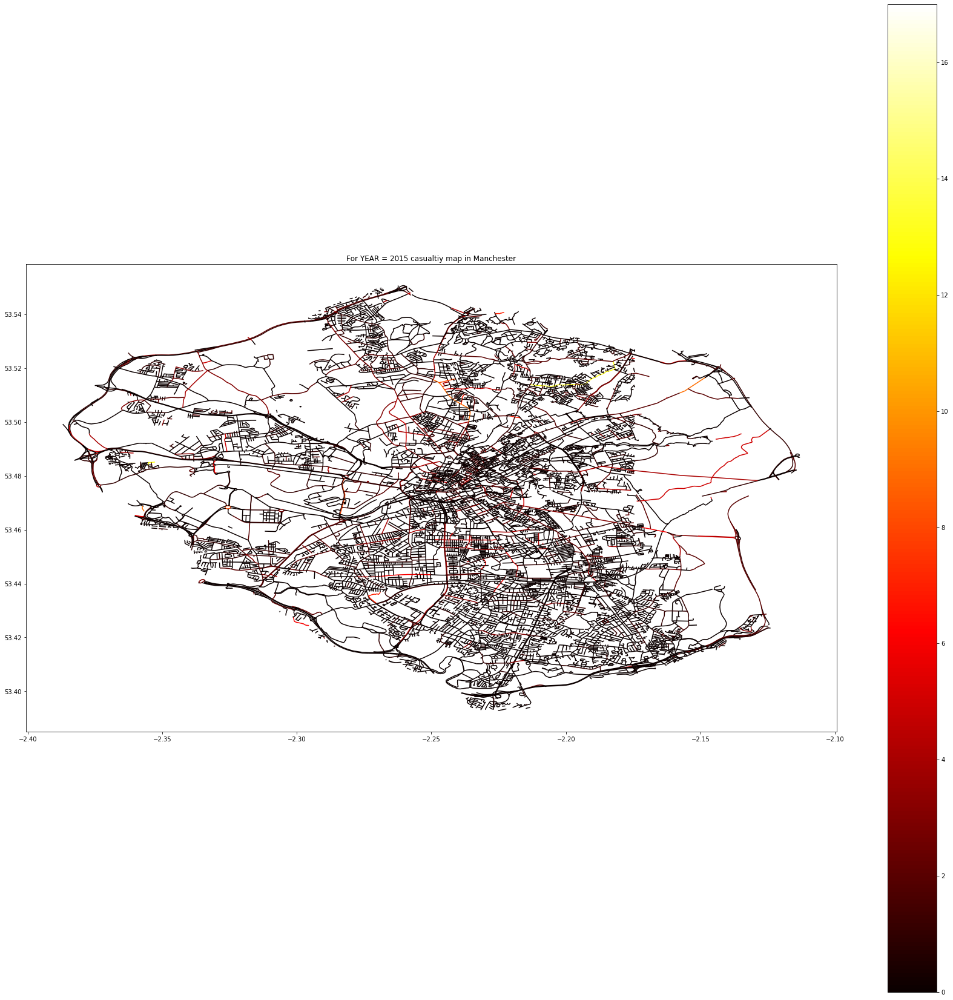

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.or

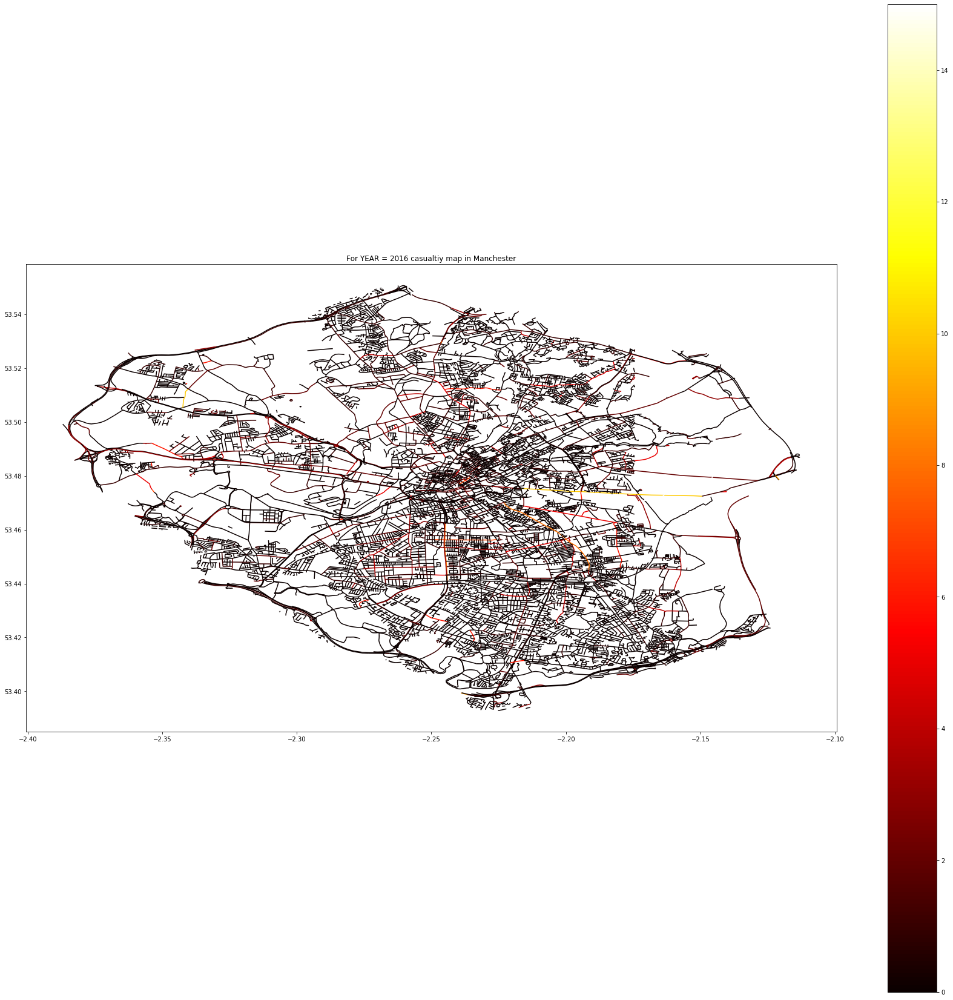

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.or

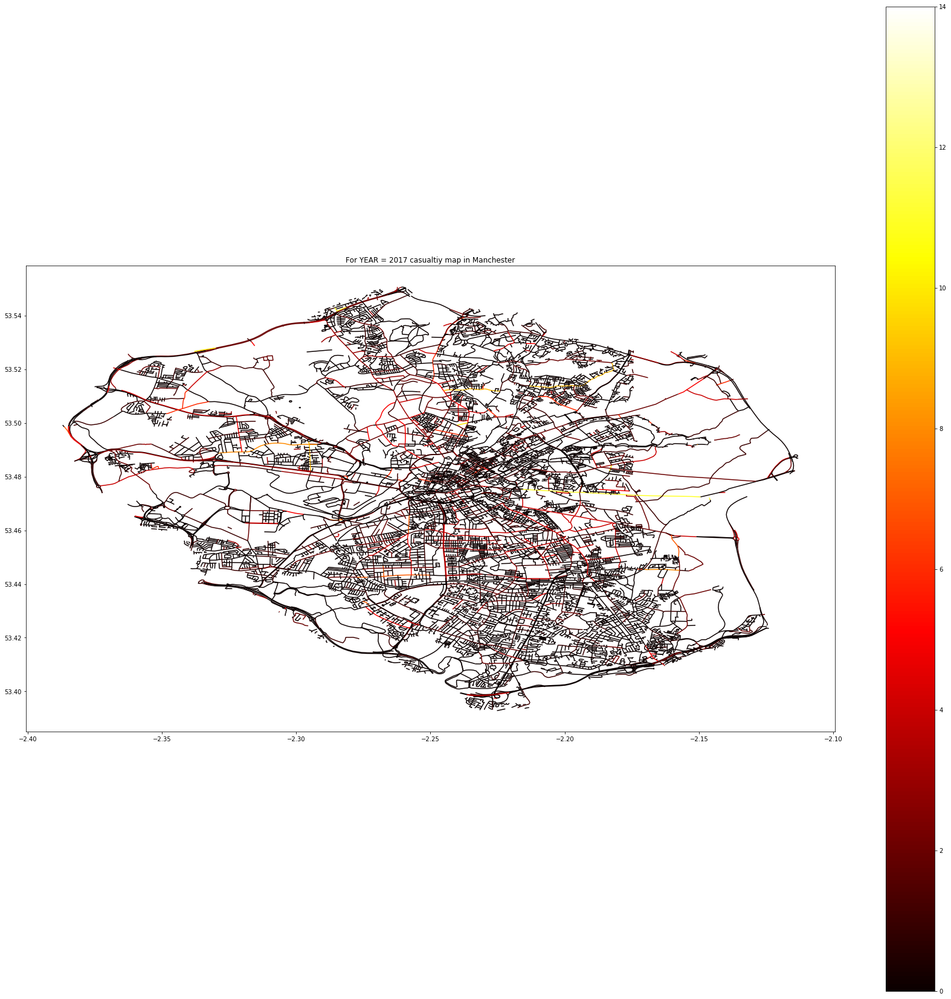

In [0]:
#with time change
#Loading map of Birmingham
map_city = gd.read_file("./Manchester/Manchester-polygon.shp")

YEAR = [2015,2016,2017]
for year in YEAR:
  df_temp_year = df_temp.loc[df_temp.Year==year].copy()    
  #Extracting points and roads in birmingham
  city = map_city.geometry.unary_union
  within_city = df_temp_year[df_temp_year.geometry.within(city)]
  city_roads = map_uk[map_uk.geometry.within(city)]
  city_roads.reset_index(inplace=True,drop=True)

  #Initializing all roads with 0 casulaity
  city_roads['casuality'] = 0
  city_roads["lon_bounds"] = city_roads.geometry.bounds["minx"]
  city_roads["lon_bounds_up"] = city_roads.geometry.bounds["maxx"]
  city_roads["lat_bounds"] = city_roads.geometry.bounds["miny"]
  city_roads["lat_bounds_up"] = city_roads.geometry.bounds["minx"]

  #Since the road number from accident is unreliable, we use nearest distance of a point from line(roads) to find the road
  t = 0.0007
  for i in tqdm(range(len(within_city)),desc="Assigning roads to points",position=0,leave=True):
    temp_roads = city_roads.loc[(abs(city_roads["lon_bounds"]-within_city.iloc[i,:]["longitude"])<=t) | (abs(city_roads["lat_bounds"]-within_city.iloc[i,:]["latitude"])<=t) | (abs(city_roads["lon_bounds_up"]-within_city.iloc[i,:]["longitude"])<=t) | (abs(city_roads["lat_bounds_up"]-within_city.iloc[i,:]["latitude"])<=t)]
    min_index = temp_roads.geometry.distance(within_city.iloc[i,:].geometry).idxmin()
    city_roads["casuality"].iloc[min_index] = city_roads.iloc[min_index,:]["casuality"] + within_city.iloc[i,:]["casuality"]

  #Visualization
  fig, ax = plt.subplots(figsize = (30,30)) 
  plt.title("For YEAR = {} casualtiy map in Manchester".format(year))
  city_roads.plot(column='casuality', cmap='hot',legend=True,ax=ax)
  plt.show()

In [0]:
#Time wise visualization of manchester city roads
df_temp.Year.value_counts()

2005    198735
2006    189161
2007    182115
2008    170591
2009    163554
2010    154414
2011    151474
2014    146322
2012    145571
2015    140056
2013    138660
2016    136621
2017    129982
Name: Year, dtype: int64

In [0]:
#Loading map of Birmingham
map_city = gd.read_file("./birimgham/Birmingham-polygon.shp")

#Extracting points and roads in birmingham
city = map_city.geometry.unary_union
within_city = df_temp[df_temp.geometry.within(city)]
city_roads = map_uk[map_uk.geometry.within(city)]
city_roads.reset_index(inplace=True,drop=True)

#Initializing all roads with 0 casulaity
city_roads['casuality'] = 0
city_roads["lon_bounds"] = city_roads.geometry.bounds["minx"]
city_roads["lon_bounds_up"] = city_roads.geometry.bounds["maxx"]
city_roads["lat_bounds"] = city_roads.geometry.bounds["miny"]
city_roads["lat_bounds_up"] = city_roads.geometry.bounds["minx"]

#Since the road number from accident is unreliable, we use nearest distance of a point from line(roads) to find the road
t = 0.0007
for i in tqdm(range(len(within_city)),desc="Assigning roads to points",position=0,leave=True):
  temp_roads = city_roads.loc[(abs(city_roads["lon_bounds"]-within_city.iloc[i,:]["longitude"])<=t) | (abs(city_roads["lat_bounds"]-within_city.iloc[i,:]["latitude"])<=t) | (abs(city_roads["lon_bounds_up"]-within_city.iloc[i,:]["longitude"])<=t) | (abs(city_roads["lat_bounds_up"]-within_city.iloc[i,:]["latitude"])<=t)]
  min_index = temp_roads.geometry.distance(within_city.iloc[i,:].geometry).idxmin()
  city_roads["casuality"].iloc[min_index] = city_roads.iloc[min_index,:]["casuality"] + within_city.iloc[i,:]["casuality"]
city_roads.to_file("./birimgham/Birimingham_causality/Casuality_Birmingham.shp")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,

In [0]:
Birmingham_roads = city_roads.copy()

In [0]:
#Max Casualities
Birmingham_roads.iloc[Birmingham_roads.casuality.idxmax(),:]

osm_id                                                     4017652
name                                              Bordesley Circus
ref                                                           None
type                                                         trunk
oneway                                                           0
maxspeed                                                         0
geometry         LINESTRING (-1.874563 52.4726038, -1.8749002 5...
casuality                                                      201
lon_bounds                                                -1.87556
lon_bounds_up                                             -1.87415
lat_bounds                                                 52.4726
lat_bounds_up                                             -1.87556
Name: 1458, dtype: object

Text(0.5, 1, 'Birmingham road heat map')

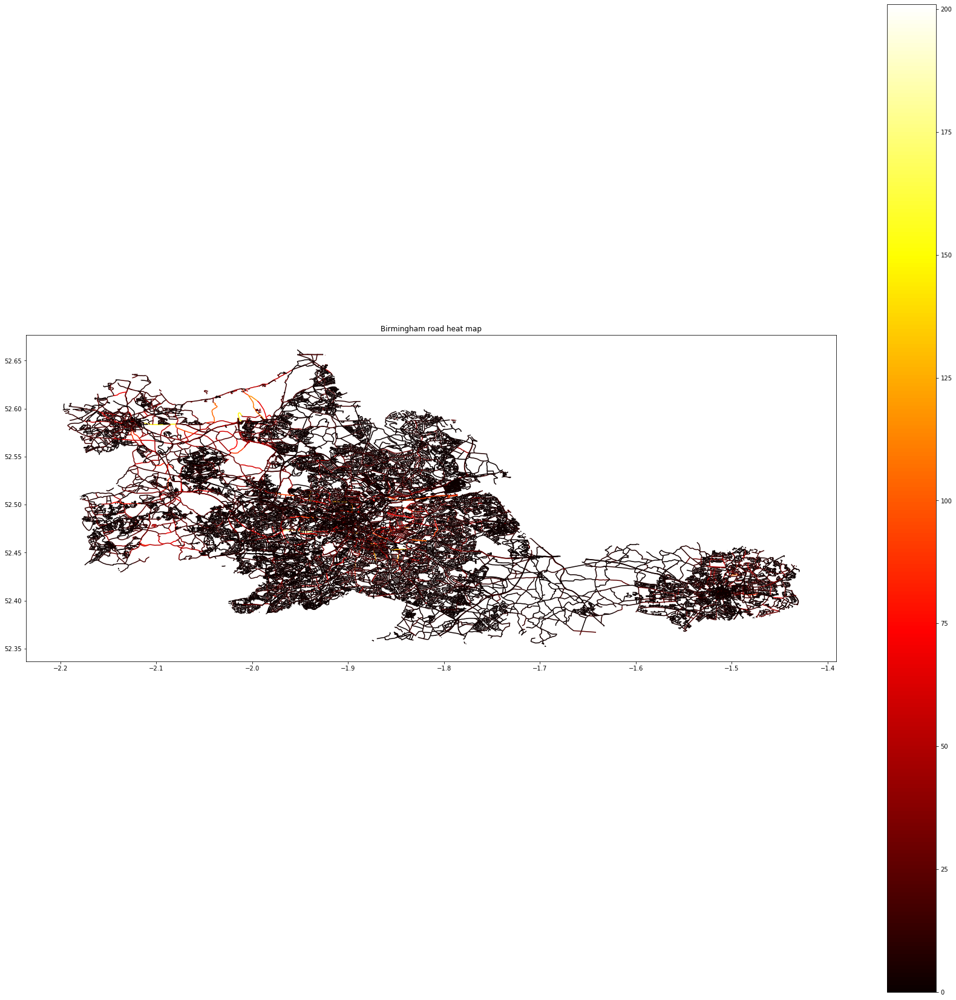

In [0]:
fig, ax = plt.subplots(figsize = (30,30)) 
Birmingham_roads.plot(column='casuality', cmap='hot',legend=True,ax=ax)
plt.title("Birmingham road heat map")

Assigning roads to points:  57%|█████▋    | 3371/5884 [01:10<00:40, 61.64it/s]/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] 

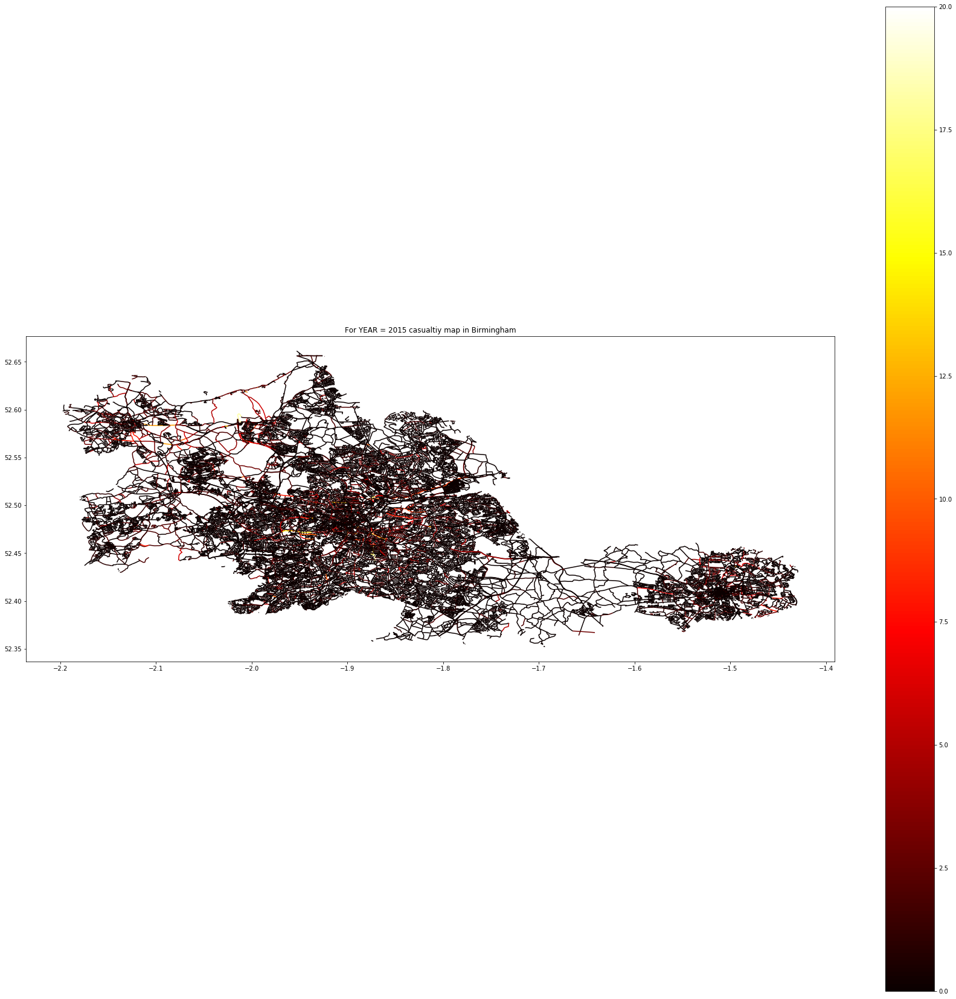

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.or

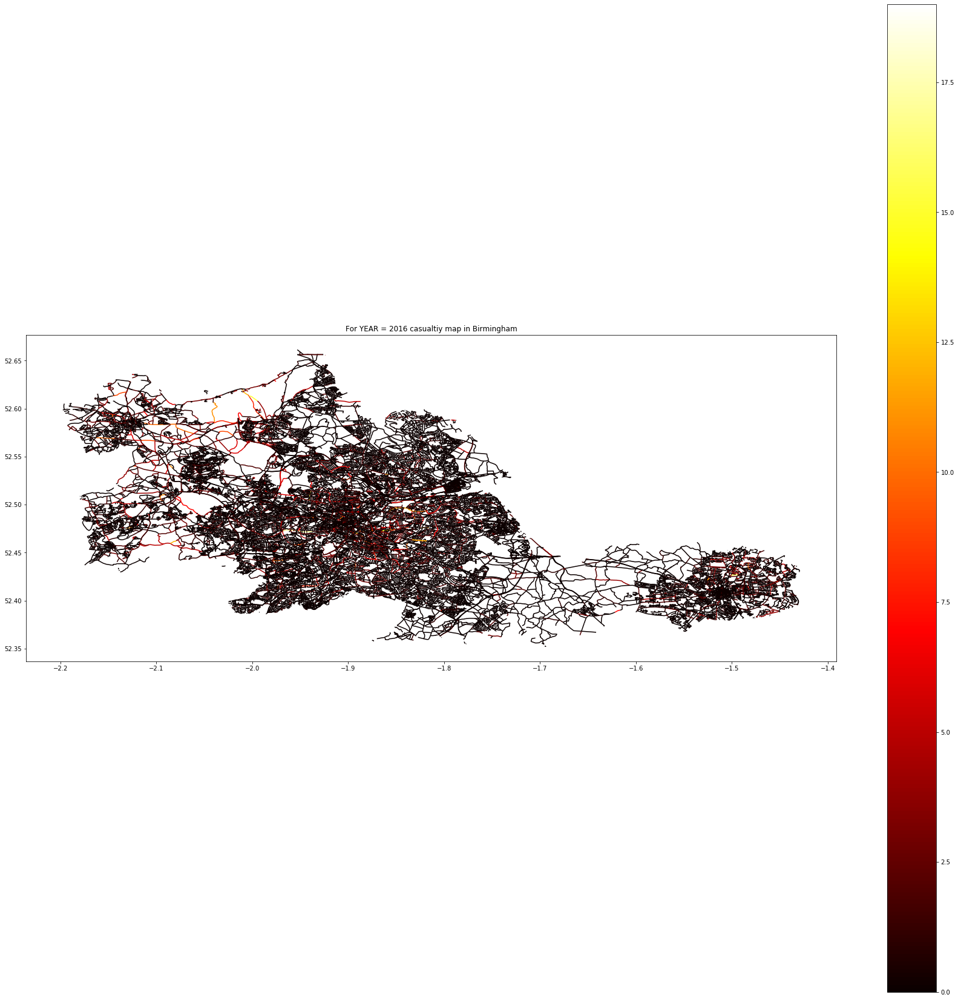

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.or

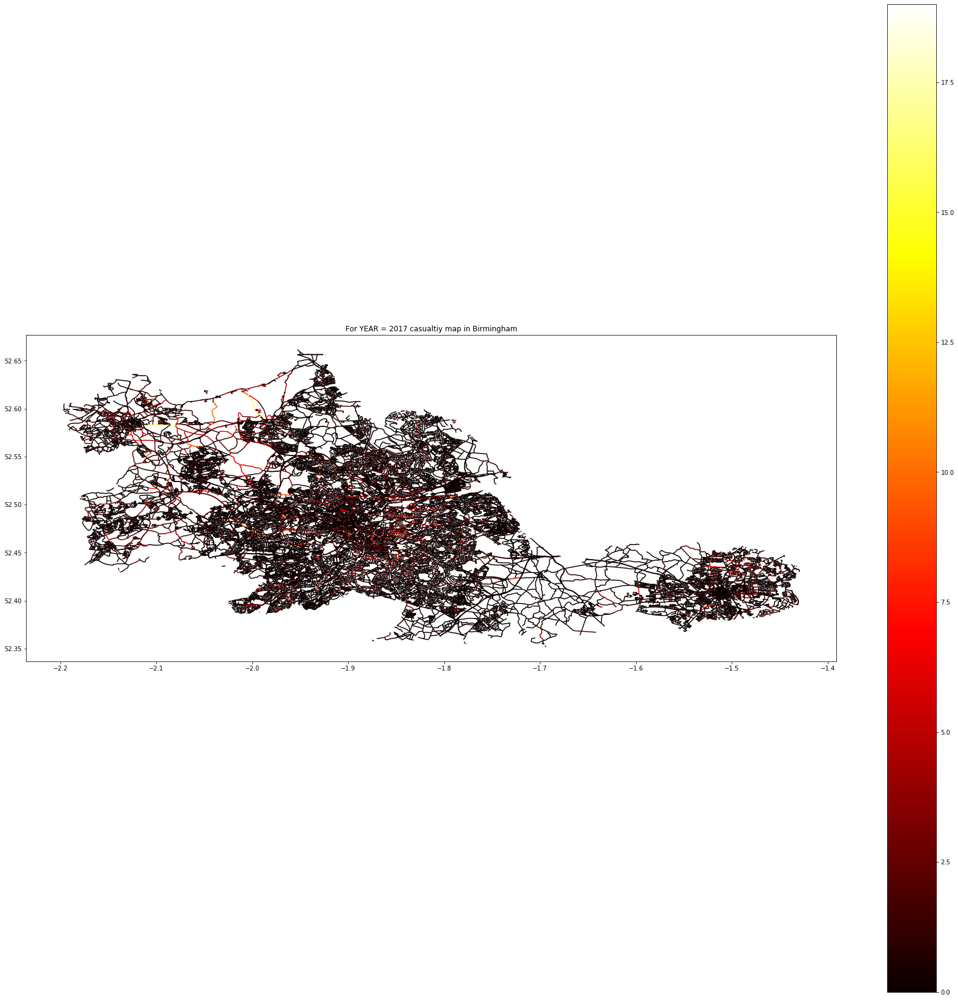

In [0]:
#with time change
#Loading map of Birmingham
map_city = gd.read_file("./birimgham/Birmingham-polygon.shp")

YEAR = [2015,2016,2017]
for year in YEAR:
  df_temp_year = df_temp.loc[df_temp.Year==year].copy()    
  #Extracting points and roads in birmingham
  city = map_city.geometry.unary_union
  within_city = df_temp_year[df_temp_year.geometry.within(city)]
  city_roads = map_uk[map_uk.geometry.within(city)]
  city_roads.reset_index(inplace=True,drop=True)

  #Initializing all roads with 0 casulaity
  city_roads['casuality'] = 0
  city_roads["lon_bounds"] = city_roads.geometry.bounds["minx"]
  city_roads["lon_bounds_up"] = city_roads.geometry.bounds["maxx"]
  city_roads["lat_bounds"] = city_roads.geometry.bounds["miny"]
  city_roads["lat_bounds_up"] = city_roads.geometry.bounds["minx"]

  #Since the road number from accident is unreliable, we use nearest distance of a point from line(roads) to find the road
  t = 0.0007
  for i in tqdm(range(len(within_city)),desc="Assigning roads to points",position=0,leave=True):
    temp_roads = city_roads.loc[(abs(city_roads["lon_bounds"]-within_city.iloc[i,:]["longitude"])<=t) | (abs(city_roads["lat_bounds"]-within_city.iloc[i,:]["latitude"])<=t) | (abs(city_roads["lon_bounds_up"]-within_city.iloc[i,:]["longitude"])<=t) | (abs(city_roads["lat_bounds_up"]-within_city.iloc[i,:]["latitude"])<=t)]
    min_index = temp_roads.geometry.distance(within_city.iloc[i,:].geometry).idxmin()
    city_roads["casuality"].iloc[min_index] = city_roads.iloc[min_index,:]["casuality"] + within_city.iloc[i,:]["casuality"]

  #Visualization
  fig, ax = plt.subplots(figsize = (30,30)) 
  plt.title("For YEAR = {} casualtiy map in Birmingham".format(year))
  city_roads.plot(column='casuality', cmap='hot',legend=True,ax=ax)
  plt.show()